First Part Link : https://www.kaggle.com/code/mehdichaibat/credit-card-fraud-detection-part1

GitHub Repo : https://github.com/chbt-mehdi/Python/tree/main/Credit%20Card%20Fraud%20Detection

Linkedin : https://linkedin.com/in/chaibat-mehdi-data-analyst

**Description About the Project:**

This competition is the final problem statement of Recognizance'24, the ML event of Prastuti, the Electrical Dept. fest of IIT BHU.

It is important that credit card companies are able to recognize fraudulent credit card transactions so that customers are not charged for items that they did not purchase.

Formulate an ML model to detect fraudulent credit card transactions

**Evaluation :**

Submissions are evaluated on area under the ROC curve between the predicted probability and the observed target.

**Submission File:**

For each id in the test set, you must predict a probability for the isFraud variable. The file should contain a header and have the following format

**kaggle Link:**  https://www.kaggle.com/competitions/credit-card-fraud-prediction/overview

<a id="1"></a>
<h1 style="background-color: #e94560; font-size: 20px; color: #ffffff; text-align: center; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; font-weight: bold; margin: 10px; border: 1px solid; border-color: #e94560; border-radius: 1px; padding: 15px; border-radius: 8px 8px 0 0;">PACE stages</h1>


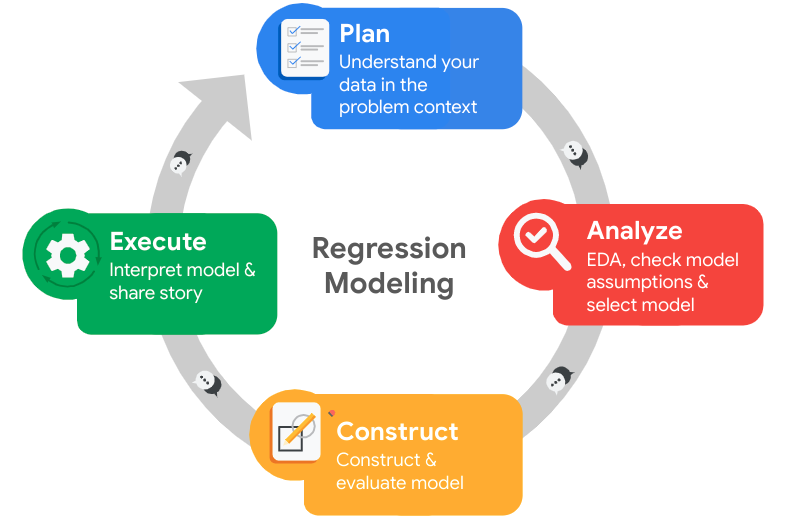

<a id="2"></a>
<h2 style="background-color: #3498db; font-size: 20px; color: #ffffff; text-align: center; font-family: 'Indie Flower', cursive; font-weight: bold; margin: 10px; border: 2px solid #ff6b6b; border-radius: 12px; padding: 15px;">Stage 1: Plan</h2>

Consider the questions in your PACE Strategy Document to reflect on the Plan stage.

In this stage, consider the following:


### Imports

* Import packages
* Load dataset


#### Import packages


In [1]:
# Import packages for data manipulation
import numpy as np
import pandas as pd

# Import packages for data preprocessing
from sklearn.preprocessing import StandardScaler

# Import packages for data visualization
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from sklearn.tree import plot_tree
from xgboost import plot_importance 

# Import packages for statistical modeling
from scipy.stats import chi2_contingency
import statsmodels.api as sm
from statsmodels.formula.api import ols

# Import packages for machine learning
from pycaret.anomaly import AnomalyExperiment
from pycaret.classification import *
import pycaret

# Miscellaneous
from ydata_profiling import ProfileReport


#### Load dataset

In [3]:
# Load dataset into a datafram

df_sample0 = pd.read_csv('D:/all/Data/case stady/Case Study 4/zFinish/Credit Card Fraud Detection/Comp/sample_submission.csv')
df_test0 = pd.read_csv('D:/all/Data/case stady/Case Study 4/zFinish/Credit Card Fraud Detection/Comp/test.csv')
df_train0 = pd.read_csv('D:/all/Data/case stady/Case Study 4/zFinish/Credit Card Fraud Detection/Comp/train.csv')

df_sample = df_sample0.copy()
df_test = df_test0.copy()
df_train = df_train0.copy()

### Data Exploration (Initial EDA and Data Cleaning)

* Understand your variables
* Clean your dataset (missing data, redundant data, outliers)


#### Gather basic information about the data

**df_sample**

In [4]:
# basic information about the data
print(df_sample.info())

# Display first few rows of the dataframe
df_sample.head(2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69129 entries, 0 to 69128
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       69129 non-null  int64  
 1   IsFraud  69129 non-null  float64
dtypes: float64(1), int64(1)
memory usage: 1.1 MB
None


,id,IsFraud
0,150000,0.5
1,150001,0.5


**df_test**

In [5]:
# basic information about the data
print(df_test.info())

# Display first few rows of the dataframe
df_test.head(2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69129 entries, 0 to 69128
Data columns (total 31 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   id                  69129 non-null  int64  
 1   Time                69129 non-null  int64  
 2   feat1               69129 non-null  float64
 3   feat2               69129 non-null  float64
 4   feat3               69129 non-null  float64
 5   feat4               69129 non-null  float64
 6   feat5               69129 non-null  float64
 7   feat6               69129 non-null  float64
 8   feat7               69129 non-null  float64
 9   feat8               69129 non-null  float64
 10  feat9               69129 non-null  float64
 11  feat10              69129 non-null  float64
 12  feat11              69129 non-null  float64
 13  feat12              69129 non-null  float64
 14  feat13              69129 non-null  float64
 15  feat14              69129 non-null  float64
 16  feat

,id,Time,feat1,feat2,feat3,feat4,feat5,feat6,feat7,feat8,...,feat20,feat21,feat22,feat23,feat24,feat25,feat26,feat27,feat28,Transaction_Amount
0,150000,73899,-0.681234,-0.371212,0.385966,0.955703,2.064078,0.338827,-0.539452,-0.254046,...,0.183560,-0.253324,0.266668,-0.153829,0.455969,-0.503628,0.257588,-0.456685,-0.298919,30.42
1,150001,73899,-1.098947,-0.959377,0.324934,0.703908,1.090582,-1.595909,0.584548,0.260069,...,0.334764,0.130108,0.676928,-0.161070,-0.638011,-0.273424,0.711132,0.349967,0.141233,23.00


**df_train**

In [6]:
# basic information about the data
print(df_train.info())

# Display first few rows of the dataframe
df_train.head(2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150000 entries, 0 to 149999
Data columns (total 32 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   id                  150000 non-null  int64  
 1   Time                150000 non-null  float64
 2   feat1               150000 non-null  float64
 3   feat2               150000 non-null  float64
 4   feat3               150000 non-null  float64
 5   feat4               150000 non-null  float64
 6   feat5               150000 non-null  float64
 7   feat6               150000 non-null  float64
 8   feat7               150000 non-null  float64
 9   feat8               150000 non-null  float64
 10  feat9               150000 non-null  float64
 11  feat10              150000 non-null  float64
 12  feat11              150000 non-null  float64
 13  feat12              150000 non-null  float64
 14  feat13              150000 non-null  float64
 15  feat14              150000 non-nul

,id,Time,feat1,feat2,feat3,feat4,feat5,feat6,feat7,feat8,...,feat21,feat22,feat23,feat24,feat25,feat26,feat27,feat28,Transaction_Amount,IsFraud
0,0,0.0,2.074329,-0.129425,-1.137418,0.412846,-0.192638,-1.210144,0.110697,-0.263477,...,-0.334701,-0.887840,0.336701,-0.110835,-0.291459,0.207733,-0.076576,-0.059577,1.98,0
1,1,0.0,1.998827,-1.250891,-0.520969,-0.894539,-1.122528,-0.270866,-1.029289,0.050198,...,0.054848,-0.038367,0.133518,-0.461928,-0.465491,-0.464655,-0.009413,-0.038238,84.00,0


#### Gather descriptive statistics about the data

In [7]:
# descriptive statistics about the data
df_train.describe().T

,count,mean,std,min,25%,50%,75%,max
id,150000.0,74999.500000,43301.414527,0.000000,37499.750000,74999.500000,112499.250000,149999.000000
Time,150000.0,49785.422340,18733.655609,0.000000,39411.000000,53785.000000,63833.000000,73899.000000
feat1,150000.0,0.069456,1.346553,-22.173926,-0.844248,0.671327,1.171271,2.390816
feat2,150000.0,-0.003674,1.161502,-44.247914,-0.621724,0.003677,0.753340,16.068473
feat3,150000.0,0.739860,1.012801,-19.088980,0.181373,0.826497,1.360362,6.145578
feat4,150000.0,0.104810,1.230909,-5.069484,-0.738399,0.095342,0.967657,12.547997
feat5,150000.0,-0.254623,1.048268,-21.090735,-0.912254,-0.322525,0.242796,34.581260
feat6,150000.0,0.151934,1.182964,-25.659750,-0.590892,-0.068690,0.492931,15.082516
feat7,150000.0,-0.165443,0.802668,-31.179799,-0.667139,-0.144551,0.334553,23.256066
feat8,150000.0,0.166254,0.691267,-28.903442,-0.078114,0.125052,0.396056,18.270586


<a id="2"></a>
<h2 style="background-color: #3498db; font-size: 20px; color: #ffffff; text-align: center; font-family: 'Indie Flower', cursive; font-weight: bold; margin: 10px; border: 2px solid #2980b9; border-radius: 12px; padding: 15px;">Step 2: Analyze </h2>

* Data Exploration (Initial EDA and data cleaning)
* Understand your variables
* Clean your dataset (missing data, redundant data ...)


#### Check missing values

In [8]:
# Check for missing values
print("numbers of missing values in df_train : ",df_train.isna().sum().sum())
print("numbers of missing values in df_test : ",df_test.isna().sum().sum())

numbers of missing values in df_train :  0
numbers of missing values in df_test :  0


#### Check duplicates

In [9]:
# Check for duplicates
print("numbers of duplicate in df_train : ",df_train.duplicated().sum())
print("numbers of duplicate in df_test : ",df_test.duplicated().sum())

numbers of duplicate in df_train :  0
numbers of duplicate in df_test :  0


#### HeatMap

- Check the correclation between columns

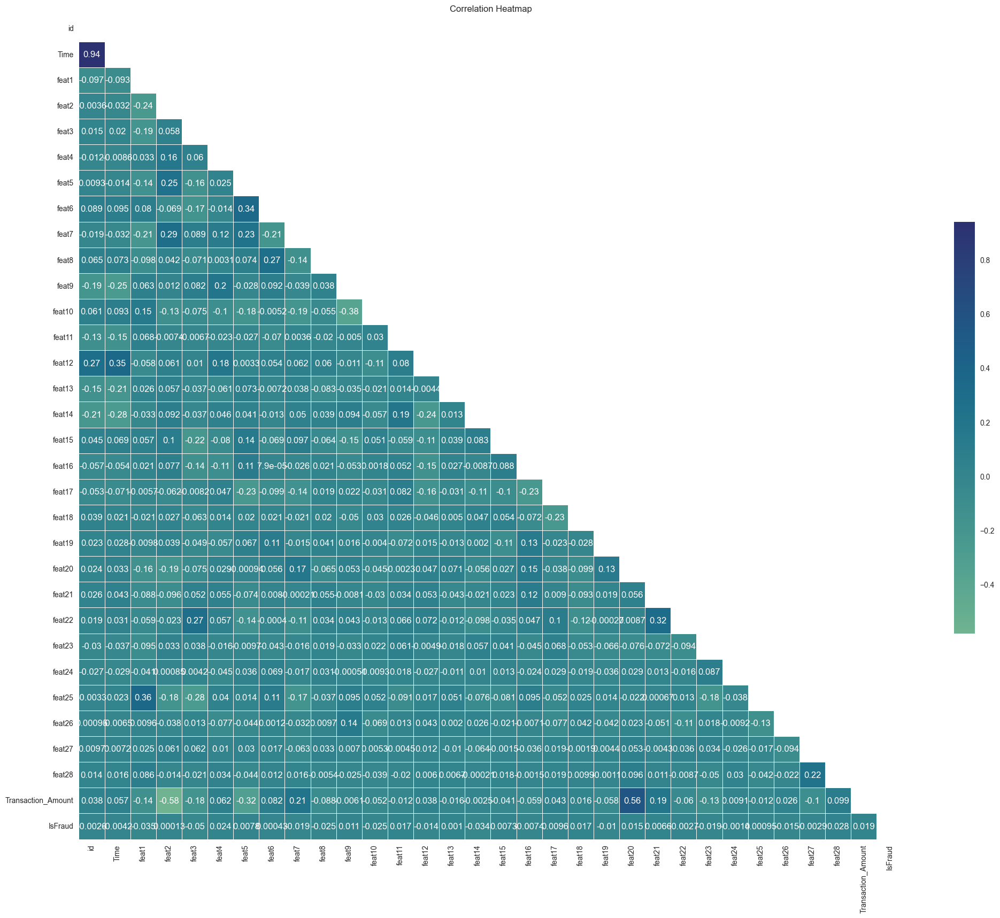

In [10]:
# Create a figure
plt.figure(figsize=(25, 20))

# Compute the correlation matrix for all the numeric columns in the dataframe
correlation_matrix = df_train.select_dtypes(include=['float64', 'int64']).corr(method='pearson')

# Create a mask to hide the upper triangle of the heatmap
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Create a heatmap with annotations, using the 'crest' colormap
sns.heatmap(correlation_matrix, annot=True, cmap='crest', mask=mask, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.title('Correlation Heatmap')
# Display the plot
plt.show()

#### Feature Distribution

- An overview of the distribution of values for each feature within the dataset.

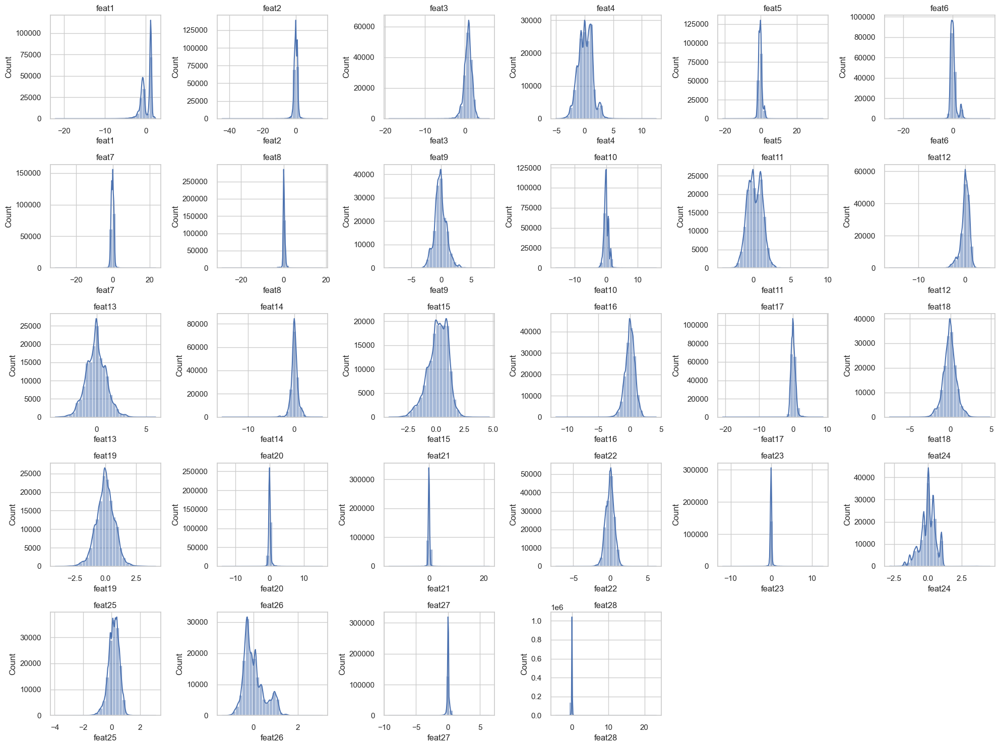

In [11]:
# Setting the style of seaborn plots to 'whitegrid'
sns.set_theme(style='whitegrid')

# Creating a new figure with specified size
plt.figure(figsize=(20, 15))

# Looping over each column in the DataFrame (excluding 'id', 'Time', and the last two columns)
# is used to show a progress bar
for i, column in enumerate(df_train.columns[2:-2]): 
    # Creating a subplot for each column
    plt.subplot(5, 6, i+1)
    # Plotting a histogram for each column
    sns.histplot(df_train[column], kde=True, bins=30)
    # Setting the title of each subplot to the column name
    plt.title(column)

# Adjusting the layout so that there's no overlap between subplots
plt.tight_layout()
# Displaying the figure with all subplots
plt.show()

Each feature predominantly exhibits a Gaussian-like distribution, though with distinct variations in skewness and kurtosis. 

A closer examination reveals that certain features are characterized by a bimodal distribution.

#### Dataset Balance

In [12]:
#check the balance of the df
df_train['IsFraud'].value_counts(normalize=True) * 100

0    99.820667
1     0.179333
Name: IsFraud, dtype: float64

Given that the dataset is highly imbalanced, as indicated by the distribution of the IsFraud variable (0.998207 for class ‘0’ and 0.001793 for class ‘1’), both classification and anomaly detection could be considered for the credit card fraud detection task.

Anomaly detection algorithms are particularly effective with imbalanced data. They function by learning the “normal” pattern in the data (which in this case would be non-fraudulent transactions) and then flagging any deviation from this pattern as a potential anomaly or fraud.

**Note:** I will initially apply a classification approach, and subsequently explore anomaly detection methods. This strategy allows for a comprehensive evaluation of different techniques given the nature of the dataset.

<a id="2"></a>
<h2 style="background-color: #f7ab00; font-size: 20px; color: #ffffff; text-align: center; font-family: 'Indie Flower', cursive; font-weight: bold; margin: 10px; border: 2px solid #ff6b6b; border-radius: 12px; padding: 15px;">Stage 3: Construct</h2>

### Model Building, Results and Evaluation

- Model preparation
- Machine learning models
- Evaluate the model
- Best Classification model
- Submission

**Note:** I'll start with the method I'm most comfortable with, even if it's slower. This will help me solidify my understanding. Then, I'll try the two newer methods I discovered: the one from my heart attack prediction project on Kaggle ( a compact method that doesn’t require too many steps) and the second one is PyCaret.

**Note:** I will apply dimensionality reduction because I don’t have enough computational power to tune it correctly. This will happen at the end of my project.

**Notes: Confusion matrix**



True negatives (The upper-left): The number of instances where the model accurately predicted that a credit card fraud would not occur.

False positives (The upper-right): The number of instances where the model incorrectly predicted a credit card fraud, even though it did not occur.

False negatives (The bottom-left): The number of instances where the model incorrectly predicted that a credit card fraud would not occur, but it did.

True positives (The bottom-right): The number of instances where the model accurately predicted a credit card fraud.

#### Model preparation

In [14]:
# Split into train and test sets
from sklearn.model_selection import train_test_split
y = df_train["IsFraud"]
X = df_train.drop(columns=['IsFraud','id'],axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state = 42, stratify=y)

In [15]:
# Get shape of each training and testing set
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((112500, 30), (37500, 30), (112500,), (37500,))

#### StandardScaler

In machine learning, different features can have different ranges. For example, age might range from 0 to 100, while income might range from 0 to 100,000. This difference in scale can cause issues when training a model, as the feature with the larger scale may dominate the other features.

To prevent this, we use feature scaling, which brings all features to the same scale. The StandardScaler in your code standardizes features by removing the mean (making it 0) and scaling to unit variance (making it 1). This ensures that all features contribute equally to the model, improving its performance.

In [16]:
# Create the scaler
scaler = StandardScaler()

# Scale the training data
X_train_scale = scaler.fit_transform(X_train)

# Scale the test data
X_test_scale = scaler.transform(X_test)


#### BoxPlot StandardScaler Viz

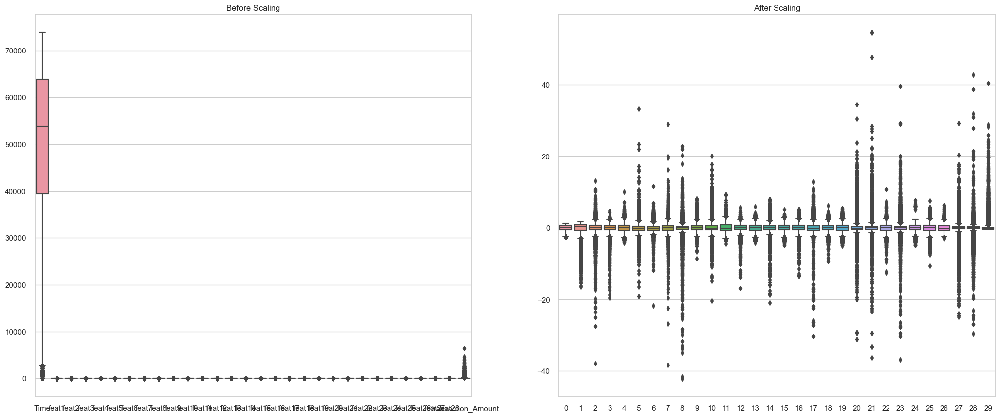

In [ ]:
# Set up the figure size
plt.subplots(figsize=(25, 10))

# Create a boxplot for the training data before scaling
plt.subplot(1, 2, 1)
sns.boxplot(data=X_train)
plt.title('Before Scaling')

# Create a boxplot for the training data after scaling
plt.subplot(1, 2, 2)
sns.boxplot(data=X_train_scale)
plt.title('After Scaling')

# Display the plots
plt.show()


**Note:** Normally, I would change X_test, X_train to X_test_scale, X_train_scale , but for simplicity, I will leave it as X_test and X_train.

In [17]:
X_train = X_train_scale
X_test = X_test_scale

#### Evaluation metrics

- AUC is the area under the ROC curve; it's also considered the probability that the model ranks a random positive example more highly than a random negative example.
- Precision measures the proportion of data points predicted as True that are actually True, in other words, the proportion of positive predictions that are true positives.
- Recall measures the proportion of data points that are predicted as True, out of all the data points that are actually True. In other words, it measures the proportion of positives that are correctly classified.
- Accuracy measures the proportion of data points that are correctly classified.
- F1-score is an aggregation of precision and recall.

**Note:** We will choose the model with the best AUC-ROC scores.

### Machine learning models '**Third: PyCaret Method**'
- I will use Classification and Anomaly Detection.

#### **Classification**

In [18]:
#drop id column
df_train_pyc = df_train.drop(columns='id')

In [19]:
s = ClassificationExperiment()
s = setup(df_train_pyc, target = 'IsFraud', session_id = 42, normalize = True)

,Description,Value
0,Session id,42
1,Target,IsFraud
2,Target type,Binary
3,Original data shape,"(150000, 31)"
4,Transformed data shape,"(150000, 31)"
5,Transformed train set shape,"(105000, 31)"
6,Transformed test set shape,"(45000, 31)"
7,Numeric features,30
8,Preprocess,True
9,Imputation type,simple


##### Compare Models

In [20]:
# compare baseline models
best = compare_models(sort='AUC')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
qda,Quadratic Discriminant Analysis,0.9641,0.7720,0.3360,0.0170,0.0323,0.0290,0.0689,0.3410
lr,Logistic Regression,0.9981,0.7620,0.0108,0.1500,0.0201,0.0199,0.0394,1.1280
lda,Linear Discriminant Analysis,0.9939,0.7502,0.1655,0.0616,0.0890,0.0866,0.0978,0.4120
nb,Naive Bayes,0.9648,0.7307,0.3044,0.0157,0.0299,0.0266,0.0625,0.1520
gbc,Gradient Boosting Classifier,0.9975,0.7198,0.0263,0.0371,0.0305,0.0295,0.0300,45.2140
ada,Ada Boost Classifier,0.9981,0.7101,0.0374,0.1583,0.0597,0.0593,0.0756,8.8920
xgboost,Extreme Gradient Boosting,0.9982,0.7046,0.0105,0.1500,0.0195,0.0194,0.0390,0.8860
rf,Random Forest Classifier,0.9982,0.6644,0.0000,0.0000,0.0000,-0.0000,-0.0000,28.5360
et,Extra Trees Classifier,0.9982,0.6584,0.0000,0.0000,0.0000,0.0000,0.0000,4.9820
lightgbm,Light Gradient Boosting Machine,0.9959,0.5646,0.0427,0.0452,0.0399,0.0382,0.0400,1.1010


In [21]:
#save the models in df
py_Classification = pull()

In [22]:
print(best)

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)


##### Analyze Model

This function analyzes the performance of a trained model on the test set. It may require re-training the model in certain cases.

In [23]:
# functional API
evaluate_model(best)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

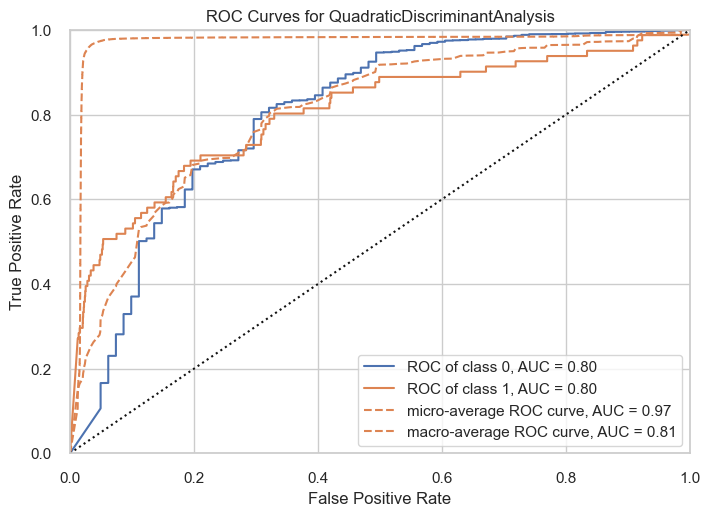

In [24]:
# functional API
plot_model(best, plot = 'auc')

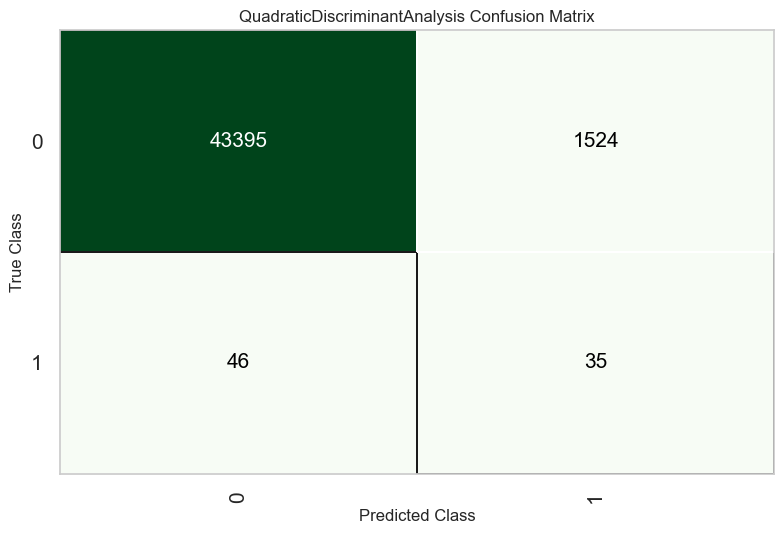

In [25]:
# functional API
plot_model(best, plot = 'confusion_matrix')

##### Predictions

The predict_model function returns prediction_label and prediction_score (probability of the predicted class) as new columns in dataframe. When data is None (default), it uses the test set (created during the setup function) for scoring.

- Train Dataset

In [26]:
# functional API
predict_model(best)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Quadratic Discriminant Analysis,0.9651,0.8029,0.4321,0.0225,0.0427,0.0394,0.0923


,Time,feat1,feat2,feat3,feat4,feat5,feat6,feat7,feat8,feat9,...,feat23,feat24,feat25,feat26,feat27,feat28,Transaction_Amount,IsFraud,prediction_label,prediction_score
75480,53879.0,1.202659,-0.721802,0.868759,-0.903861,-0.987557,0.264969,-1.057516,0.425998,1.335908,...,0.004957,-0.301096,0.020947,1.555909,-0.062358,-0.009751,1.000000,0,0,1.0
650,544.0,-1.343626,2.477517,0.168875,-0.075033,0.064059,0.372951,-1.018871,-3.143947,-1.068692,...,0.313725,-0.527008,0.001279,0.143665,0.042747,-0.014950,9.990000,0,1,1.0
74951,53779.0,-2.446716,-0.824276,1.840150,1.814395,-0.842667,1.702990,0.161869,0.865982,-0.001147,...,-0.125536,-0.250109,-0.223536,-0.168941,0.035485,-0.086814,246.639999,0,0,1.0
76053,53952.0,-1.446436,0.844396,0.948757,-0.333838,0.257944,-0.666739,0.394826,0.096668,1.602336,...,0.064282,0.442557,0.031177,0.472617,0.843039,0.495867,29.559999,0,0,1.0
46742,44714.0,1.217824,-0.965889,0.907506,-0.637003,-1.396417,-0.141527,-1.102899,0.055929,-0.355900,...,-0.153869,0.146966,0.382536,-0.062239,0.044383,0.034833,69.989998,0,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98032,60333.0,-0.540241,0.270139,1.534108,0.341700,0.365747,-0.441212,0.065666,0.176909,-0.485725,...,0.245545,0.187718,-0.792902,0.265966,0.025945,0.107719,1.980000,0,0,1.0
6485,3908.0,-0.362469,1.134581,1.399960,0.032644,0.025996,-0.967559,0.768175,-0.118791,-0.534123,...,-0.019599,0.356479,-0.167830,0.071089,0.272444,0.122361,0.890000,0,0,1.0
82173,55601.0,0.416938,-1.435577,1.184968,3.144080,-1.547368,1.943400,-0.746340,0.457803,0.777580,...,-0.417836,-0.435009,0.225752,-0.045680,-0.058262,0.081045,394.250000,0,0,1.0
139393,71648.0,1.030594,0.135845,0.930798,2.734774,-0.382534,0.936402,-0.272870,0.384749,-0.241470,...,-0.178908,-0.021064,0.581218,0.063000,0.001553,0.016065,46.779999,0,0,1.0


- Test Dataset

In [27]:
df_test_pyc = df_test.drop(columns='id')

In [28]:
# predict model on test dataset
predictions_cm = predict_model(best, data=df_test_pyc)
predictions_cm.head()

,Time,feat1,feat2,feat3,feat4,feat5,feat6,feat7,feat8,feat9,...,feat22,feat23,feat24,feat25,feat26,feat27,feat28,Transaction_Amount,prediction_label,prediction_score
0,73899,-0.681234,-0.371212,0.385966,0.955703,2.064078,0.338827,-0.539452,-0.254046,0.010960,...,0.266668,-0.153829,0.455969,-0.503628,0.257588,-0.456685,-0.298919,30.42,0,1.0000
1,73899,-1.098947,-0.959377,0.324934,0.703908,1.090582,-1.595909,0.584548,0.260069,0.057549,...,0.676928,-0.161070,-0.638011,-0.273424,0.711132,0.349967,0.141233,23.00,0,1.0000
2,73899,0.977029,-0.270984,0.471526,-1.232570,0.957537,-0.636602,-0.953060,-1.491744,0.226865,...,1.175087,-0.325895,-0.362636,0.306037,0.004828,0.037389,0.058222,198.00,1,0.8266
3,73900,1.176658,-0.225816,-0.246600,0.015513,1.103831,1.229516,-1.527098,-0.459769,0.749164,...,0.003800,-0.023180,-0.458338,0.481427,-0.381415,0.080165,0.027372,9.99,0,1.0000
4,73900,0.804828,-0.272967,0.959910,-1.117567,0.395748,0.589855,1.059880,-1.101203,0.066464,...,0.078540,-0.241700,0.010130,0.302614,-0.259568,0.023127,0.056957,239.00,0,1.0000


Score means the probability of the predicted class (NOT the positive class). If prediction_label is 0 and prediction_score is 0.90, this means 90% probability of class 0. If you want to see the probability of both the classes, simply pass raw_score=True in the predict_model function.

##### Save the model

In [29]:
# save pipeline
save_model(best, 'my_best_pipeline')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['Time', 'feat1', 'feat2', 'feat3',
                                              'feat4', 'feat5', 'feat6', 'feat7',
                                              'feat8', 'feat9', 'feat10',
                                              'feat11', 'feat12', 'feat13',
                                              'feat14', 'feat15', 'feat16',
                                              'feat17', 'feat18', 'feat19',
                                              'feat20', 'feat21', 'feat22',
                                              'feat23', 'feat24', 'feat25',
                                              'feat26', 'feat27', 'f...
                                                               fill_value=None,
                                                               keep_empty_features=False,
           

load the model back in environment:

In [30]:
# load pipeline
loaded_best_pipeline = load_model('my_best_pipeline')
loaded_best_pipeline

Transformation Pipeline and Model Successfully Loaded


Pipeline(memory=FastMemory(location=C:\Users\chaib\AppData\Local\Temp\joblib),
         steps=[('numerical_imputer',
                 TransformerWrapper(exclude=None,
                                    include=['Time', 'feat1', 'feat2', 'feat3',
                                             'feat4', 'feat5', 'feat6', 'feat7',
                                             'feat8', 'feat9', 'feat10',
                                             'feat11', 'feat12', 'feat13',
                                             'feat14', 'feat15', 'feat16',
                                             'feat17', 'feat18', 'feat19',
                                             'feat20', 'feat21', 'feat22',
                                             'feat23...
                                                              fill_value=None,
                                                              keep_empty_features=False,
                                                              missing_values=nan,
                                                              strategy='most_frequent',
                                                              verbose='deprecated'))),
                ('normalize',
                 TransformerWrapper(exclude=None, include=None,
                                    transformer=StandardScaler(copy=True,
                                                               with_mean=True,
                                                               with_std=True))),
                ('trained_model',
                 QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                                               store_covariance=False,
                                               tol=0.0001))],
         verbose=False)

#### **Anomaly Detection**

The Anomaly Detection Module is an unsupervised machine learning module. Therefore, I will drop the ‘IsFraud’ column from my dataframe.

In [31]:
df_train_pyc_ad = df_train_pyc.drop(columns='IsFraud')

In [32]:
s = AnomalyExperiment()
s.setup(df_train_pyc_ad, session_id = 42, normalize = True)

,Description,Value
0,Session id,42
1,Original data shape,"(150000, 30)"
2,Transformed data shape,"(150000, 30)"
3,Numeric features,30
4,Preprocess,True
5,Imputation type,simple
6,Numeric imputation,mean
7,Categorical imputation,mode
8,Normalize,True
9,Normalize method,zscore


##### Create Model

In [33]:
# OOP API
iforest = s.create_model('iforest')
print(iforest)

IForest(behaviour='new', bootstrap=False, contamination=0.05,
    max_features=1.0, max_samples='auto', n_estimators=100, n_jobs=-1,
    random_state=42, verbose=0)


In [34]:
# OOP API
s.models()

,Name,Reference
ID,,
abod,Angle-base Outlier Detection,pyod.models.abod.ABOD
cluster,Clustering-Based Local Outlier,pycaret.internal.patches.pyod.CBLOFForceToDouble
cof,Connectivity-Based Local Outlier,pyod.models.cof.COF
iforest,Isolation Forest,pyod.models.iforest.IForest
histogram,Histogram-based Outlier Detection,pyod.models.hbos.HBOS
knn,K-Nearest Neighbors Detector,pyod.models.knn.KNN
lof,Local Outlier Factor,pyod.models.lof.LOF
svm,One-class SVM detector,pyod.models.ocsvm.OCSVM
pca,Principal Component Analysis,pyod.models.pca.PCA


##### Analyze Model

In [35]:
# OOP API
s.plot_model(iforest, plot = 'tsne')

##### Assign Model

In [36]:
# functional API
result = s.assign_model(iforest)
result.head()

,Time,feat1,feat2,feat3,feat4,feat5,feat6,feat7,feat8,feat9,...,feat22,feat23,feat24,feat25,feat26,feat27,feat28,Transaction_Amount,Anomaly,Anomaly_Score
0,0.0,2.074329,-0.129425,-1.137418,0.412846,-0.192638,-1.210144,0.110697,-0.263477,0.742144,...,-0.887840,0.336701,-0.110835,-0.291459,0.207733,-0.076576,-0.059577,1.98,0,-0.049452
1,0.0,1.998827,-1.250891,-0.520969,-0.894539,-1.122528,-0.270866,-1.029289,0.050198,-0.109948,...,-0.038367,0.133519,-0.461928,-0.465491,-0.464655,-0.009413,-0.038238,84.00,0,-0.067746
2,0.0,0.091535,1.004517,-0.223445,-0.435249,0.667548,-0.988351,0.948146,-0.084789,-0.042027,...,-0.803736,0.154495,0.951234,-0.506919,0.085046,0.224458,0.087356,2.69,0,-0.058466
3,0.0,1.979649,-0.184949,-1.064206,0.120125,-0.215238,-0.648829,-0.087826,-0.035367,0.885838,...,-0.079792,0.167701,-0.042939,0.000799,-0.096148,-0.057780,-0.073839,1.00,0,-0.067495
4,0.0,1.025898,-0.171827,1.203717,1.243900,-0.636572,1.099074,-0.938651,0.569239,0.692665,...,0.608908,0.027901,-0.262813,0.257834,-0.252829,0.108338,0.021051,1.00,0,-0.077404


##### Predictions

In [37]:
# OOP API
predictions_ad = s.predict_model(iforest, data = df_test_pyc)
predictions_ad.head()

,Time,feat1,feat2,feat3,feat4,feat5,feat6,feat7,feat8,feat9,...,feat22,feat23,feat24,feat25,feat26,feat27,feat28,Transaction_Amount,Anomaly,Anomaly_Score
0,1.287184,-0.557493,-0.316434,-0.349422,0.691274,2.211942,0.157988,-0.465959,-0.608016,0.138256,...,0.584823,-0.291343,0.781740,-1.725926,0.498137,-2.104789,-1.953406,-0.256094,0,-0.051013
1,1.287184,-0.867703,-0.822819,-0.409683,0.486713,1.283269,-1.477515,0.934376,0.135715,0.184878,...,1.299869,-0.313743,-1.090656,-1.128263,1.455397,1.501306,0.739835,-0.302845,0,-0.063703
2,1.287184,0.674000,-0.230142,-0.264943,-1.086502,1.156349,-0.666578,-0.981253,-2.398501,0.354315,...,2.168115,-0.823609,-0.619339,0.376155,-0.035345,0.103942,0.231894,0.799781,0,-0.028301
3,1.287237,0.822252,-0.191255,-0.973995,-0.072546,1.295907,0.910920,-1.696418,-0.905620,0.876983,...,0.126668,0.112805,-0.783137,0.831509,-0.850561,0.295172,0.043128,-0.384818,0,-0.089442
4,1.287237,0.546116,-0.231850,0.217269,-0.993072,0.620426,0.370191,1.526568,-1.833534,0.193800,...,0.256932,-0.563162,0.018666,0.367267,-0.593387,0.040184,0.224159,1.058110,0,-0.065575


##### Save the model

In [38]:
# OOP API
s.save_model(iforest, 'iforest_pipeline')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['Time', 'feat1', 'feat2', 'feat3',
                                              'feat4', 'feat5', 'feat6', 'feat7',
                                              'feat8', 'feat9', 'feat10',
                                              'feat11', 'feat12', 'feat13',
                                              'feat14', 'feat15', 'feat16',
                                              'feat17', 'feat18', 'feat19',
                                              'feat20', 'feat21', 'feat22',
                                              'feat23', 'feat24', 'feat25',
                                              'feat26', 'feat27', 'f...
                                                               strategy='most_frequent',
                                                               verbose='deprecated'))),
    

load the model back in the environment:

In [39]:
# OOP API
loaded_model = s.load_model('iforest_pipeline')
print(loaded_model)

Transformation Pipeline and Model Successfully Loaded
Pipeline(memory=FastMemory(location=C:\Users\chaib\AppData\Local\Temp\joblib),
         steps=[('numerical_imputer',
                 TransformerWrapper(exclude=None,
                                    include=['Time', 'feat1', 'feat2', 'feat3',
                                             'feat4', 'feat5', 'feat6', 'feat7',
                                             'feat8', 'feat9', 'feat10',
                                             'feat11', 'feat12', 'feat13',
                                             'feat14', 'feat15', 'feat16',
                                             'feat17', 'feat18', 'feat19',
                                             'feat20', 'feat21', 'feat22',
                                             'feat23...
                                                              strategy='most_frequent',
                                                              verbose='deprecated'))),
              

<a id="1"></a>
<h2 style="background-color: #36a853; font-size: 20px; color: #ffffff; text-align: center; font-family: 'Indie Flower', cursive; font-weight: bold; margin: 10px; border: 2px solid #ff6b6b; border-radius: 12px; padding: 15px;">Stage 4: Execute</h2>

- Interpret model performance and results



### Best Classification Model

In [41]:
#pycaret models
py_Classification

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
qda,Quadratic Discriminant Analysis,0.9641,0.7720,0.3360,0.0170,0.0323,0.0290,0.0689,0.341
lr,Logistic Regression,0.9981,0.7620,0.0108,0.1500,0.0201,0.0199,0.0394,1.128
lda,Linear Discriminant Analysis,0.9939,0.7502,0.1655,0.0616,0.0890,0.0866,0.0978,0.412
nb,Naive Bayes,0.9648,0.7307,0.3044,0.0157,0.0299,0.0266,0.0625,0.152
gbc,Gradient Boosting Classifier,0.9975,0.7198,0.0263,0.0371,0.0305,0.0295,0.0300,45.214
ada,Ada Boost Classifier,0.9981,0.7101,0.0374,0.1583,0.0597,0.0593,0.0756,8.892
xgboost,Extreme Gradient Boosting,0.9982,0.7046,0.0105,0.1500,0.0195,0.0194,0.0390,0.886
rf,Random Forest Classifier,0.9982,0.6644,0.0000,0.0000,0.0000,-0.0000,-0.0000,28.536
et,Extra Trees Classifier,0.9982,0.6584,0.0000,0.0000,0.0000,0.0000,0.0000,4.982
lightgbm,Light Gradient Boosting Machine,0.9959,0.5646,0.0427,0.0452,0.0399,0.0382,0.0400,1.101


After analysing the different models used in our credit card fraud detection project, it is evident that the Quadratic Discriminant Analysis (QDA) model consistently outperforms the other models across most metrics during the testing phase.

### Submission

In [42]:
# classification model
Submission_cm = df_sample0.copy()  
Submission_cm['IsFraud'] = predictions_cm['prediction_score']
Submission_cm.head()

,id,IsFraud
0,150000,1.0000
1,150001,1.0000
2,150002,0.8266
3,150003,1.0000
4,150004,1.0000


In [43]:
# anomaly detection
Submission_ad = df_sample0.copy()  
Submission_ad['IsFraud'] = predictions_ad['Anomaly_Score']
Submission_ad.head()

,id,IsFraud
0,150000,-0.051013
1,150001,-0.063703
2,150002,-0.028301
3,150003,-0.089442
4,150004,-0.065575


In [44]:
Submission_ad.to_csv('Submission_ad.csv',index=False)
Submission_cm.to_csv('Submission_cm.csv',index=False)